## Initializations
Import Packages

In [1]:
import torch

from model import SoyModel
from dataset import Soy

import albumentations as A
from albumentations.pytorch import ToTensorV2

import imageio.v3 as iio
import matplotlib.pyplot as plt
import numpy as np

import cv2

from skimage.feature import peak_local_max
from sklearn.metrics import r2_score, mean_absolute_error


/home/ddgi/miniconda3/envs/torch/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Load model

In [2]:
model = SoyModel(pretrained=False)
checkpoint = torch.load('./runs/soy_3000/ckpt/best_mae.pth')
model_weight = checkpoint["model_state_dict"]
model.load_state_dict(model_weight)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = model.to(device)

/home/ddgi/miniconda3/envs/torch/lib/python3.9/site-packages/timm/models/_factory.py:114: UserWarning: Mapping deprecated model name convnext_small_in22k to current convnext_small.fb_in22k.
  model = create_fn(


Define transformation

In [3]:
transform = A.Compose(
    [   
        A.PadIfNeeded(min_height=None, min_width=None, pad_height_divisor=32, pad_width_divisor=32, position=A.PadIfNeeded.PositionType.TOP_LEFT,border_mode=cv2.BORDER_CONSTANT, value=0),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

## Inference on single image

In [12]:
import ast
img_path = '../soybean-data/Soybean_seed_counting/images_a/D12E-D13E_DSC04516_a_6_D12E_a_1.png'
label_path = '../soybean-data/Soybean_seed_counting/labels_a/D12E-D13E_DSC04516_a_6_D12E_a_1.txt'
img = iio.imread(img_path)
h, w, _ = img.shape
img_tensor = transform(image=img)['image'].unsqueeze(0).to(device)

with open(label_path, 'r') as f:
    gts = [ast.literal_eval(line[:-1]) for line in f]

gts_np = np.array(gts)
gts_round = np.trunc(gts_np).astype(np.int32)

model.eval()
with torch.no_grad():
    bx0, bx1, bx2, bx3, bx4 = model(img_tensor)

In [15]:
rst = bx0[0].permute(1, 2, 0).detach().cpu().numpy()
img = img/255
rst = rst[:h, :w]

In [16]:
coordinates = peak_local_max(rst[..., 0], min_distance=5, threshold_abs=0.1)
mask = np.zeros_like(img)[... ,0]
mask[coordinates[:, 0], coordinates[:, 1]] = 1

[]

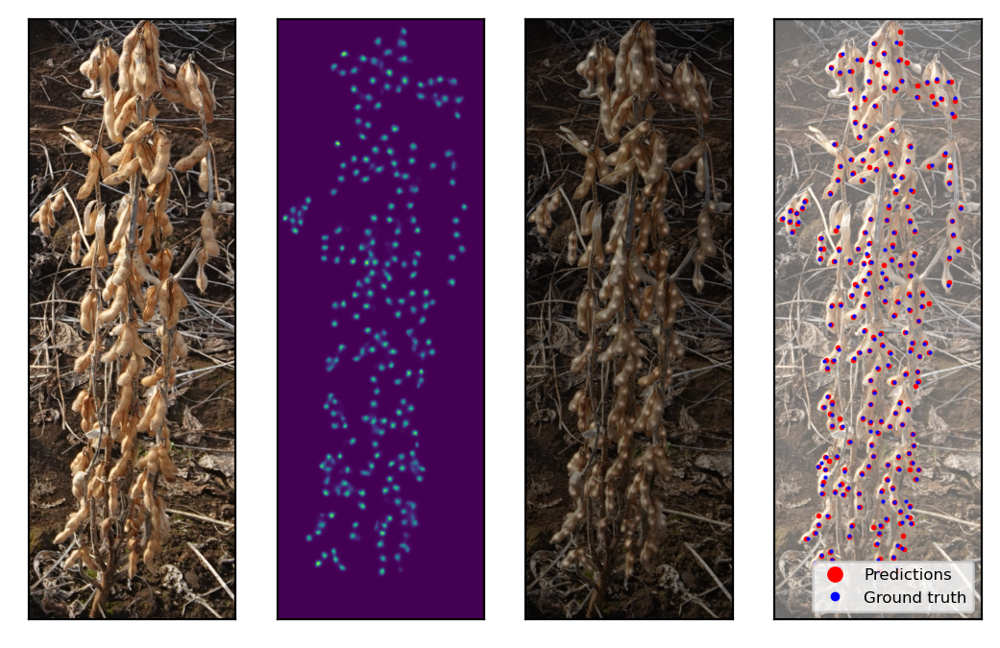

In [45]:
rst1 = rst.copy()

fig = plt.figure(dpi=200)

ax = plt.subplot(141)
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])

ax = plt.subplot(142)
ax.imshow(rst)
ax.set_xticks([])
ax.set_yticks([])


ax = plt.subplot(143)
ax.imshow(0.5*img + 0.5*rst)
ax.set_xticks([])
ax.set_yticks([])

ax = plt.subplot(144)
ax.imshow(np.concatenate([img, 0.6*np.ones(img.shape[:2])[..., None]], axis=2))
ax.plot(coordinates[:, 1], coordinates[:, 0], marker='.', color='r', ls='', markersize=2, label='Predictions')
ax.plot(gts_round[:, 0], gts_round[:, 1], marker='.', color='b', ls='', markersize=1, label='Ground truth')
ax.legend(loc='lower right', fontsize="6", markerscale=5)
ax.set_xticks([])
ax.set_yticks([])



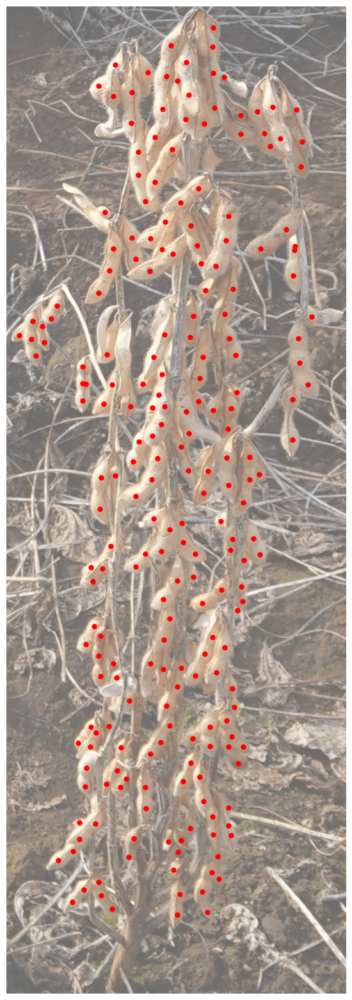

In [52]:
plt.figure(figsize=(20, 20))
ax = plt.subplot(111)
ax.imshow(np.concatenate([img, 0.6*np.ones(img.shape[:2])[..., None]], axis=2))
ax.set_axis_off()
ax.plot(coordinates[:, 1], coordinates[:, 0], marker='.', color='r', ls='', markersize=10, label='Predictions')

FPS calculation

In [28]:
import time
h, w, _ = img.shape

img_tensor = transform(image=img)['image'].unsqueeze(0).to(device)
model.eval()
with torch.no_grad():
    start = time.time()
    for i in range(100):
            bx0, bx1, bx2, bx3, bx4 = model(img_tensor)
    end = time.time()

duration = end-start
fps = 100/duration

print(f'fps: {fps}')

fps: 14.443679037741896


## Evaluation

In [5]:
data_root = '../soybean-data/Soybean_seed_counting/'
test_set = Soy(data_root, train=False, transform=transform)

In [6]:
model.eval()
gts = []
preds = []

with torch.no_grad():
    for img, points in test_set:
        bx0, bx1, bx2, bx3, bx4 = model(img.unsqueeze(0).to(device))

        rst = bx0.squeeze(0).permute(1, 2, 0).detach().cpu().numpy()
        coordinates = peak_local_max(rst[..., 0], min_distance=5, threshold_abs=0.1)

        gts.append(len(points))
        preds.append(len(coordinates))


In [7]:
r2 = r2_score(gts, preds)
mae = mean_absolute_error(gts, preds)
print(f'R2: {r2}')
print(f'MAE: {mae}')

R2: 0.934508540800363
MAE: 8.765151515151516


In [8]:
import pandas as pd
data = pd.DataFrame({'gts': gts, 'preds': preds})

Text(50, 320, '$R^2$ = 0.9345\nMAE = 8.7652')

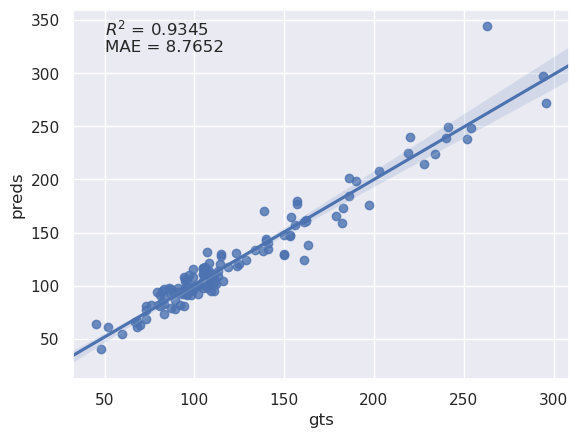

In [9]:
import seaborn as sns
from scipy import stats
sns.set_theme(style="darkgrid")

tips = sns.load_dataset("tips")
# ax = plt.subplot
g = sns.regplot(x="gts", y="preds", data=data, truncate=False)
g.text(50, 320, f'$R^2$ = {round(r2, 4)}\nMAE = {round(mae, 4)}')

## Test set
### Single Large Image

In [10]:
from pathlib import Path
ptest = Path('../soybean-data/Test_data/')

for child in ptest.glob('*.JPG'):
    print(child)
    img = iio.imread(child)
    img = A.resize(img, 1600, 2400)
    img_tensor = transform(image=img)['image'].unsqueeze(0).to(device)
    break

../soybean-data/Test_data/DSC05070.JPG


In [11]:
with torch.no_grad():
    bx0, _, _, _, _ = model(img_tensor)
    rst = bx0[0].permute(1, 2, 0).detach().cpu().numpy()
    
    
    # rst = rst[:h, :w]
    coordinates = peak_local_max(rst[..., 0], min_distance=5, threshold_abs=0.1)
    mask = np.zeros_like(img)[... ,0]
    mask[coordinates[:, 0], coordinates[:, 1]] = 1

torch.cuda.empty_cache()
img = img.copy()/255
rst1 = rst.copy()
rst1[rst1<0.3] = 0

Text(20, 80, 'Count: 735')

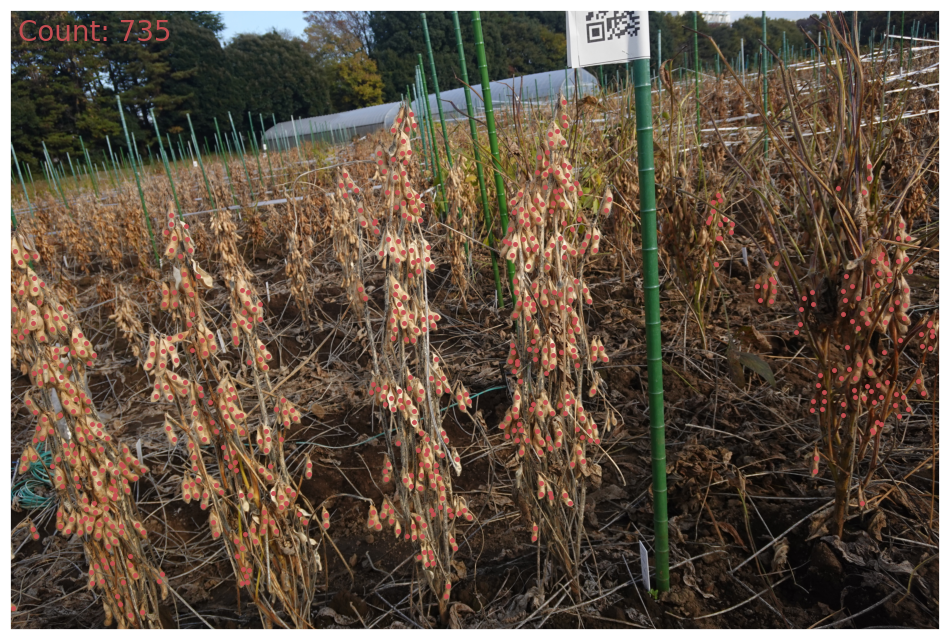

In [12]:
fig = plt.figure(figsize=(12, 12))
ax = plt.subplot(111)
ax.imshow(img)
ax.plot(coordinates[:, 1], coordinates[:, 0], marker='.', color='r', ls='', markersize=5)
ax.set_xticks([])
ax.set_yticks([])
ax.text(20, 80, f'Count: {len(coordinates)}', fontsize=20, color='r')

## 2022 dataset

### Photo 2022

In [4]:
img = iio.imread('../soybean-data/Test_data_2022/DJI_0051.JPG')
# img = iio.imread('../soybean-data/UAV-Photo1207upload/Reverse/B11-B10/DJI_0361.JPG')
# h, w, _ = img.shape
# img = A.resize(img, h//2, w//2)
# img = img
img_tensor = transform(image=img)['image'].unsqueeze(0)

torch.Size([1, 3, 1856, 3168])

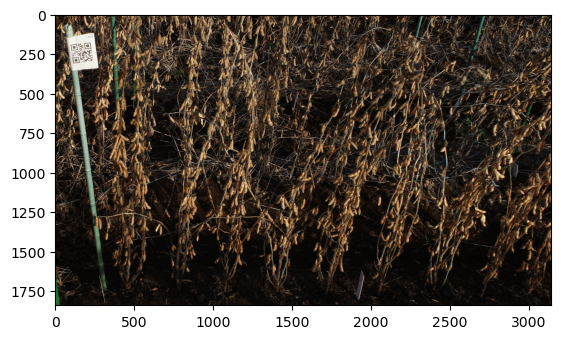

In [5]:
plt.imshow(img)
img_tensor.shape

In [6]:
with torch.no_grad():
    mask = np.zeros_like(img_tensor.squeeze(0))[0, ...]
    bx0, _, _, _, _ = model(img_tensor.to(device))
    rst = bx0[0].permute(1, 2, 0).detach().cpu().numpy()
    
    
    # rst = rst[:h, :w]
    coordinates = peak_local_max(rst[..., 0], min_distance=5, threshold_abs=0.1)
    
    mask[coordinates[:, 0], coordinates[:, 1]] = 1

torch.cuda.empty_cache()
img = img.copy()/255
rst1 = rst.copy()

Text(10, 50, 'Count: 449')

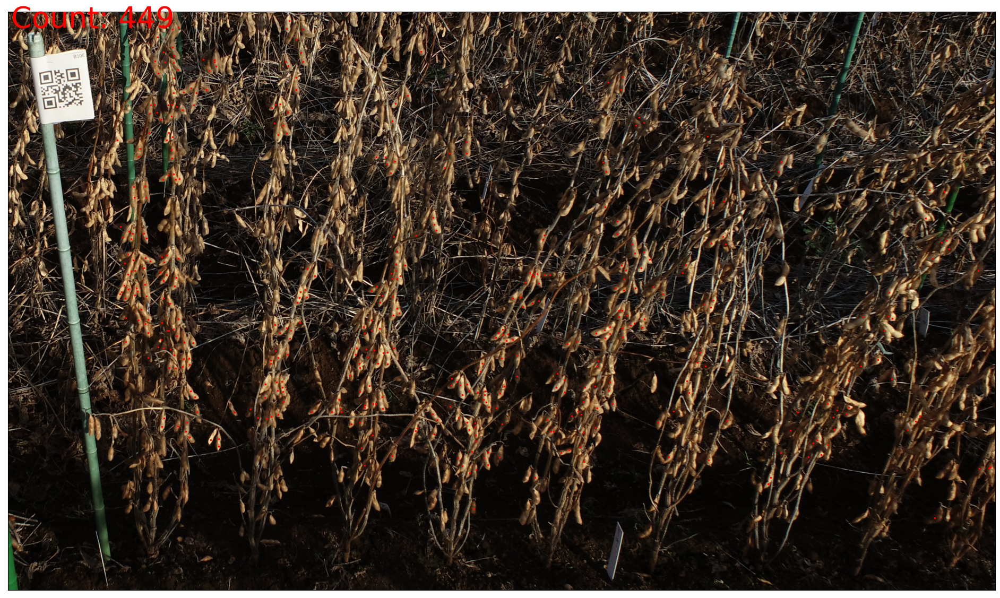

In [9]:
fig = plt.figure(figsize=(24, 24))
ax = plt.subplot(111)
ax.imshow(img)
ax.plot(coordinates[:, 1], coordinates[:, 0], marker='.', color='r', ls='', markersize=3)
ax.set_xticks([])
ax.set_yticks([])
ax.text(10, 50, f'Count: {len(coordinates)}', fontsize=40, color='r')

### Domain shift

rgb to hsv

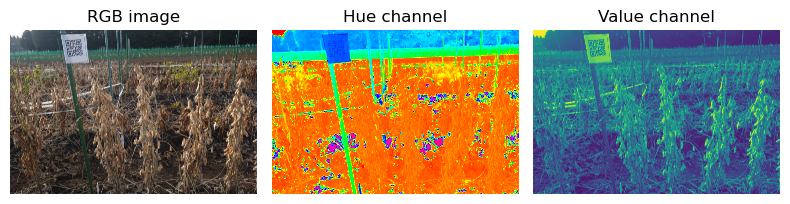

In [ ]:
from skimage.color import rgb2hsv
img = iio.imread('../dataopen/Test_data/DSC05052.JPG')
hsv_img = rgb2hsv(img)
hue_img = hsv_img[:, :, 0]
value_img = hsv_img[:, :, 2]

fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(8, 2))

ax0.imshow(img)
ax0.set_title("RGB image")
ax0.axis('off')
ax1.imshow(hue_img, cmap='hsv')
ax1.set_title("Hue channel")
ax1.axis('off')
ax2.imshow(value_img)
ax2.set_title("Value channel")
ax2.axis('off')

fig.tight_layout()

In [ ]:
np.mean(value_img)

0.35601118464052267

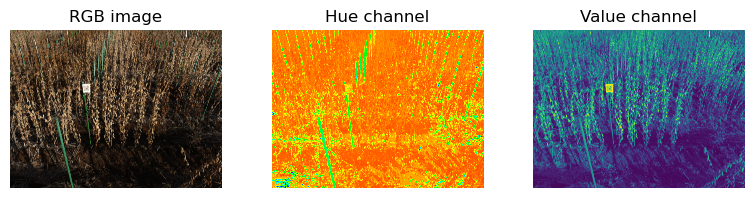

In [ ]:
img2 = iio.imread('../UAV-Photo1207upload/Forward/D10F/DJI_0061.JPG')

hsv_img2 = rgb2hsv(img2)
hue_img2 = hsv_img2[:, :, 0]
value_img2 = hsv_img2[:, :, 2]

fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(8, 2))

ax0.imshow(img2)
ax0.set_title("RGB image")
ax0.axis('off')
ax1.imshow(hue_img2, cmap='hsv')
ax1.set_title("Hue channel")
ax1.axis('off')
ax2.imshow(value_img2)
ax2.set_title("Value channel")
ax2.axis('off')

fig.tight_layout()

In [ ]:
np.mean(rgb2hsv(rgb_img2)[:, :, 2])

0.35554713414011396

In [ ]:
ratio = np.mean(value_img)/np.mean(value_img2)

hsv_img2[:, :, 2] = hsv_img2[:, :, 2] * ratio

In [64]:
from skimage.color import hsv2rgb

rgb_img2 = hsv2rgb(hsv_img2)
plt.imshow(rgb_img2)

NameError: name 'hsv_img2' is not defined

In [65]:
h, w, c = rgb_img2.shape

rgb_img2_resized = A.resize(rgb_img2[1400:2800], 1400//2, w//2)
plt.imshow(rgb_img2_resized)

NameError: name 'rgb_img2' is not defined

In [70]:
pimg2 = Path('../soybean-data/UAV-Photo1207upload/Forward/D10F/DJI_0061.JPG')
img = iio.imread(pimg2)
h, w, _ = img.shape
img = A.resize(img, h*2, w*2)
transform = A.Compose(
    [   

        A.RandomCrop(width=1000, height=1000),
        A.PadIfNeeded(min_height=None, min_width=None, pad_height_divisor=32, pad_width_divisor=32, position=A.PadIfNeeded.PositionType.TOP_LEFT,border_mode=cv2.BORDER_CONSTANT, value=0),
        # A.Resize(256, 256),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

img_tensor = transform(image=img)['image'].unsqueeze(0)

In [71]:
def denorm(tensor, mean, std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

with torch.no_grad():
    mask = np.zeros_like(img_tensor.squeeze(0))[0, ...]
    bx0, _, _, _, _ = model(img_tensor.to(device))
    rst = bx0[0].permute(1, 2, 0).detach().cpu().numpy()
    
    
    # rst = rst[:h, :w]
    coordinates = peak_local_max(rst[..., 0], min_distance=5, threshold_abs=0.1)
    
    mask[coordinates[:, 0], coordinates[:, 1]] = 1

torch.cuda.empty_cache()
# img_raw = img.copy()
img_tensor = denorm(img_tensor[0],
                    mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225))
img_raw = img_tensor.detach().cpu().permute(1,2,0).numpy().copy()
rst1 = rst.copy()

Text(10, 50, 'Count: 78')

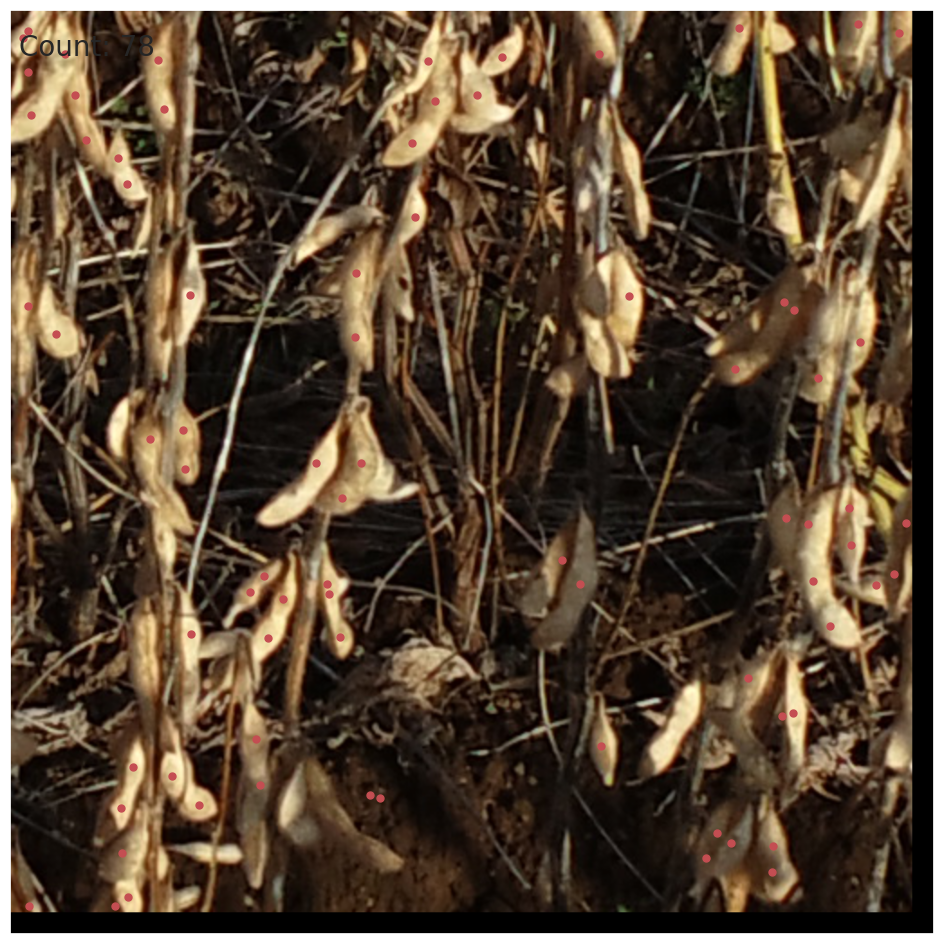

In [72]:
fig = plt.figure(figsize=(12, 12))
ax = plt.subplot(111)
ax.imshow(img_raw)
ax.plot(coordinates[:, 1], coordinates[:, 0], marker='.', color='r', ls='', markersize=10)
ax.set_xticks([])
ax.set_yticks([])
ax.text(10, 50, f'Count: {len(coordinates)}', fontsize=20)

In [109]:
# Prepare dataset
import os
from shutil import copyfile as cp

ptest2022 = Path('../UAV-Photo1207upload/')
ptest = Path('../dataopen/Test_data/')
# Domain A
dstA_root = Path('../pytorch-CycleGAN-and-pix2pix/datasets/soy_dataset/domainA')
if not dstA_root.exists():
    dstA_root.mkdir(exist_ok=True)

# Domain B
dstB_root = Path('../pytorch-CycleGAN-and-pix2pix/datasets/soy_dataset/domainB')
if not dstB_root.exists():
    dstB_root.mkdir(exist_ok=True)


FileNotFoundError: [Errno 2] No such file or directory: '../pytorch-CycleGAN-and-pix2pix/datasets/soy_dataset/domainA'

In [ ]:
for item in ptest2022.glob('**/*.JPG'):
    # print(item.name)
    src = item
    dst = dstA_root / item.name
    # print(src, dst)
    cp(src=src, dst=dst)

In [ ]:
for item in ptest.glob('**/*.JPG'):
    # print(item.name)
    src = item
    dst = dstB_root / item.name
    # print(src, dst)
    cp(src=src, dst=dst)

### Video 2022

In [ ]:
video = cv.VideoCapture("../")